# Cellbender testing - Normalization
Data should be normalized in order to compare cells because counts are affected by sequencing depth, gene length and cell cycle phase.
<br>

Standard:
Total-count normalize (library-size correct) the data matrix $\mathbf{X}$ to 10,000 reads per cell, so that counts become comparable among cells.
<br>


<div class="alert alert-warning">

**What the third section (Normalization) does**
    
This section normalizes the data based on sequencing depth and gene length so the cells are comparable. Subsequently dimensional reduction and clustering are performed to visualize samples separately. The section contains the following important subsections:

* Normalization <br>
* Dimensional reduction <br>
* Marker genes and property annotation visualizations <br>

</div>

### Loading libraries
Using sc2_seurat environment

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [14]:
#siletti
siletti='/home/hers_basak/jjiang/jack/outputs/deliverables/0_cellbender/data/siletti_filtered_1.h5ad'
siletti_CB='/home/hers_basak/jjiang/jack/outputs/deliverables/0_cellbender/data/siletti_CB_filtered_1.h5ad'



#altena
altena='/home/hers_basak/jjiang/jack/outputs/deliverables/0_cellbender/data/altena_filtered_1.h5ad'
altena_CB='/home/hers_basak/jjiang/jack/outputs/deliverables/0_cellbender/data/altena_CB_filtered_1.h5ad'


In [15]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/0_cellbender')

In [16]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_cellbender'

In [17]:
!ls data

altena_CB_filtered_1.h5ad    siletti_CB_filtered_1.h5ad
altena_CB_preprocessed.h5ad  siletti_CB_preprocessed.h5ad
altena_filtered_1.h5ad	     siletti_filtered_1.h5ad
altena_preprocessed.h5ad     siletti_preprocessed.h5ad


In [18]:
files = [siletti,siletti_CB, altena, altena_CB]

In [19]:
names = [name.split('_filtered')[0].split('/data/')[1] for name in files ]
print(names)

['siletti', 'siletti_CB', 'altena', 'altena_CB']


In [20]:
object_names_filtered=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_filtered.append("adata"+"_"+names[i]+"_"+"filtered_1")
    locals()[object_names_filtered[i]] = sc.read(files[i]) 
    print(object_names_filtered[i],' is loaded')

adata_siletti_filtered_1  is loaded
adata_siletti_CB_filtered_1  is loaded
adata_altena_filtered_1  is loaded
adata_altena_CB_filtered_1  is loaded


## Normalization

In [24]:
## Normalize and Logarithmize
for i in range(numberobj):
    sc.pp.normalize_total(locals()[object_names_filtered[i]], key_added='total_counts_norm')
    locals()[object_names_filtered[i]].raw = locals()[object_names_filtered[i]].copy()
    sc.pp.log1p(locals()[object_names_filtered[i]])
    print(object_names_filtered[i], ' has been normalized and logarithmized')

adata_siletti_filtered_1  has been normalized and logarithmized
adata_siletti_CB_filtered_1  has been normalized and logarithmized
adata_altena_filtered_1  has been normalized and logarithmized
adata_altena_CB_filtered_1  has been normalized and logarithmized


In [27]:
for i in range(numberobj):
    print(locals()[object_names_filtered[i]])

AnnData object with n_obs × n_vars = 7618 × 36135
    obs: 'species', 'atlas', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'scrublet', 'log1p', 'hvg'
AnnData object with n_obs × n_vars = 7611 × 36096
    obs: 'species', 'atlas', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ri

### Identify highly-variable genes
This step is important to choose the feature that will be used for dimensionality reduction (). In this function values of genes are normalized for the mean expression of that gene. Dispersion metric (variance/mean) is also calculated for each gene. Then within the bins the dispersion metric is normalized to identify highly variable genes among their own expression levels.

In [26]:
for i in range(numberobj): 
    sc.pp.highly_variable_genes(locals()[object_names_filtered[i]], min_mean=0.0125, max_mean=3, min_disp=0.5,flavor='seurat') #seurat_v3 is giving an error because it expects count data (not logged)
    print('worked')

worked
worked
worked
worked


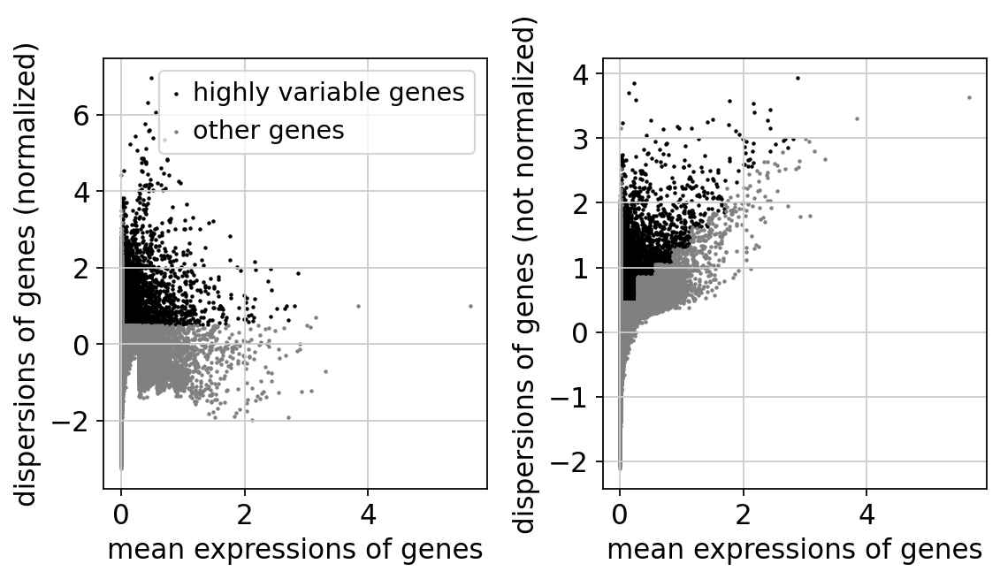

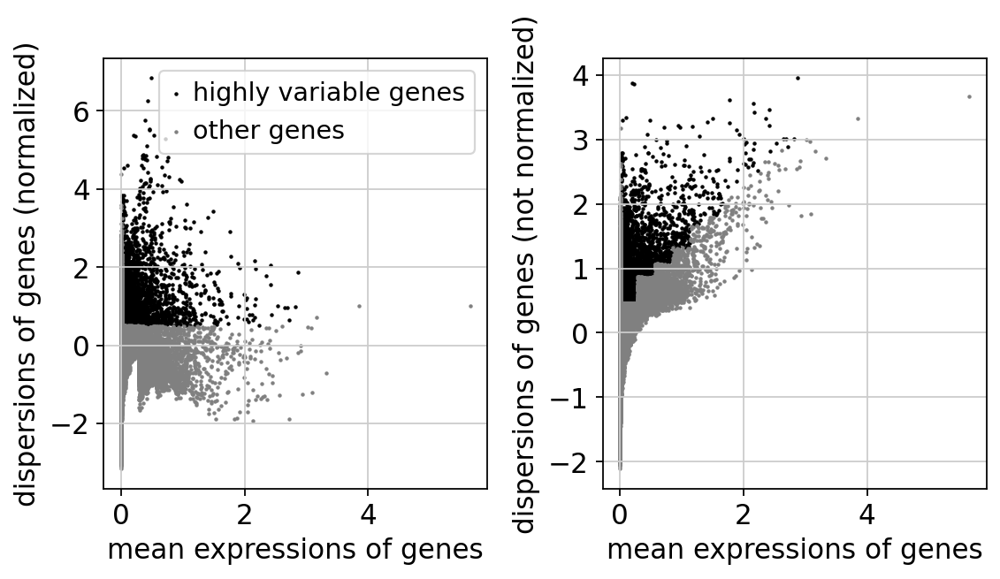

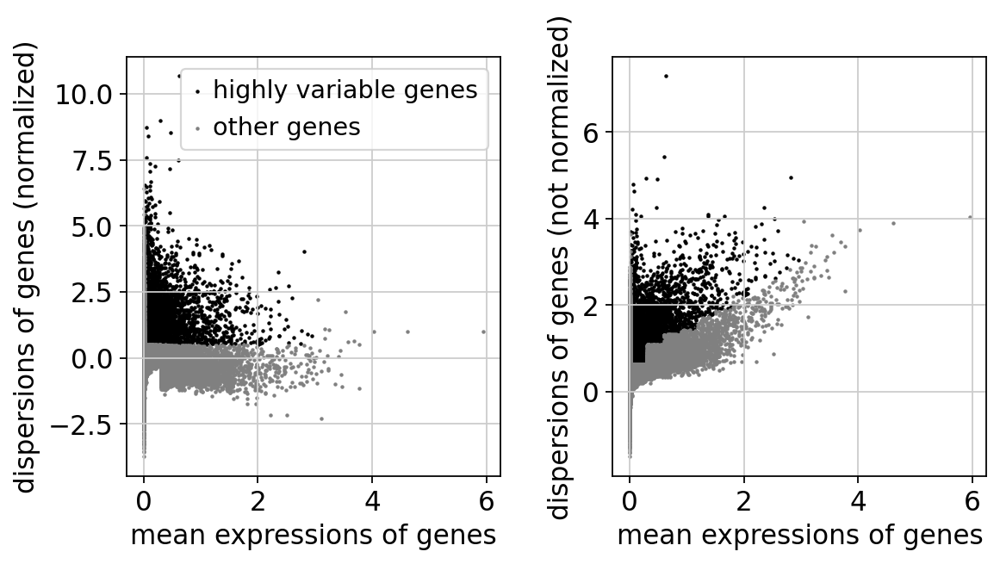

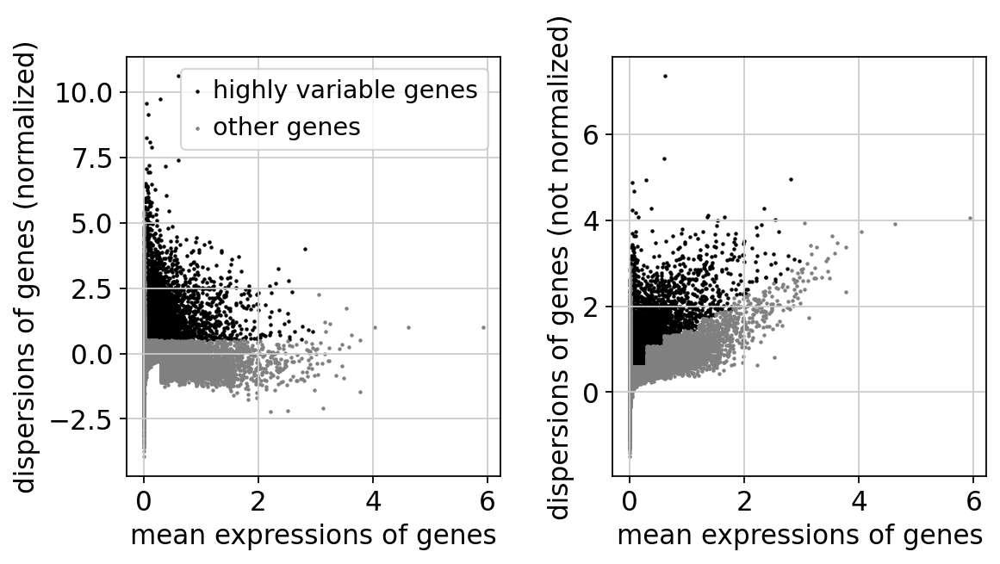

In [28]:
for i in range(numberobj): 
    sc.pl.highly_variable_genes(locals()[object_names_filtered[i]])

### regress and scale
We will compare data regressed for the number of counts and scaled to unprocessed data. It is better to do the least possible. This also saves from memory and disk space. Still, if the number of counts influence the embedding, we need to correct for this \
Note: You could skip filtering for highly variable genes only if you dont need to regress and scale
https://github.com/theislab/single-cell-tutorial/issues/35 \

Note: might be bad idea to regress out total counts as this might be correlated with celltypes...

In [29]:
for i in range(numberobj):
    locals()[object_names_filtered[i]+"_reg"] = locals()[object_names_filtered[i]].copy()
    locals()[object_names_filtered[i]+"_reg"].raw = locals()[object_names_filtered[i]+"_reg"]
    locals()[object_names_filtered[i]+"_reg"] = locals()[object_names_filtered[i]+"_reg"][:, locals()[object_names_filtered[i]+"_reg"].var['highly_variable']]
    sc.pp.regress_out(locals()[object_names_filtered[i]+"_reg"], ['total_counts']) # previously, we regreesed 'n_counts_filtered','percent_mito'
    sc.pp.scale(locals()[object_names_filtered[i]+"_reg"], max_value=10)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


In [30]:
object_names_reg = list()
numberobj = len(files)
for i in range(numberobj):
    object_names_reg.append(object_names_filtered[i]+"_reg")

In [31]:
object_names_reg

['adata_siletti_filtered_1_reg',
 'adata_siletti_CB_filtered_1_reg',
 'adata_altena_filtered_1_reg',
 'adata_altena_CB_filtered_1_reg']

# Dimensional Reduction

In [32]:
#To make reproducible plots
np.random.seed(41)

### Principal component analysis
Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [33]:
for i in range(numberobj):
    sc.tl.pca(locals()[object_names_filtered[i]], svd_solver='arpack')
#    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

siletti


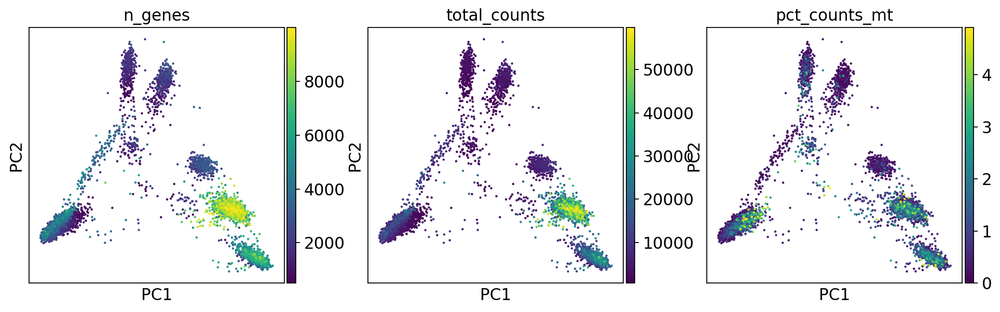

siletti_CB


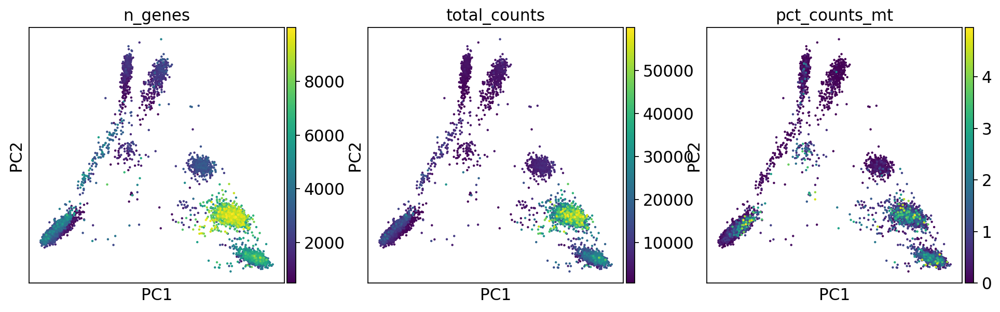

altena


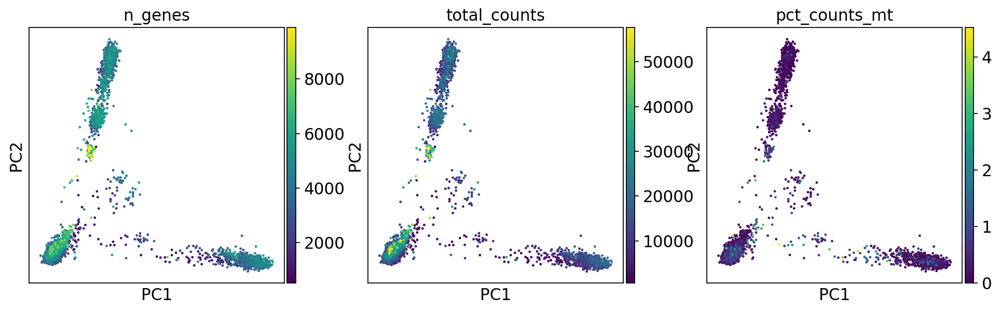

altena_CB


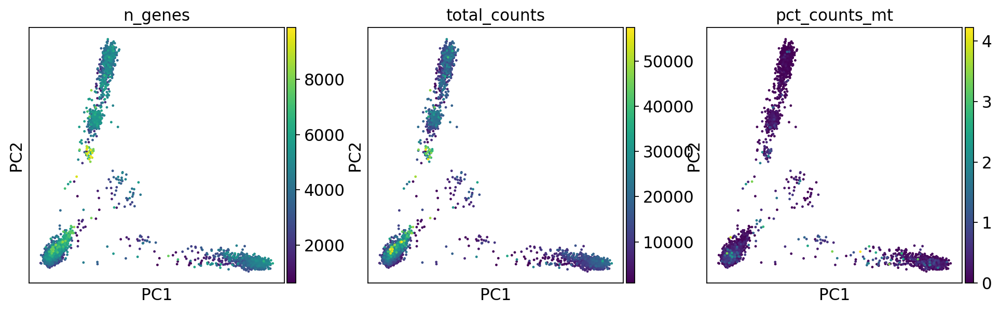

In [36]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_filtered[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'])#, save = "_"+object_names_filtered[i]+"_pca.pdf")
#    sc.pl.pca(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'], save = "_"+object_names_reg[i]+"_intron_metrics_1.pdf")


In [37]:
!ls figures/

pca_adata_altena_CB_filtered_1_pca.pdf	pca_adata_siletti_CB_filtered_1_pca.pdf
pca_adata_altena_filtered_1_pca.pdf	pca_adata_siletti_filtered_1_pca.pdf


In [38]:
for i in range(numberobj):
    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

siletti _reg


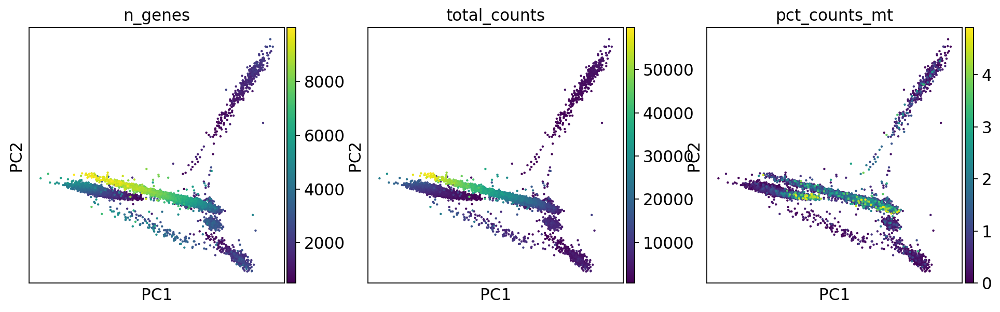

siletti_CB _reg


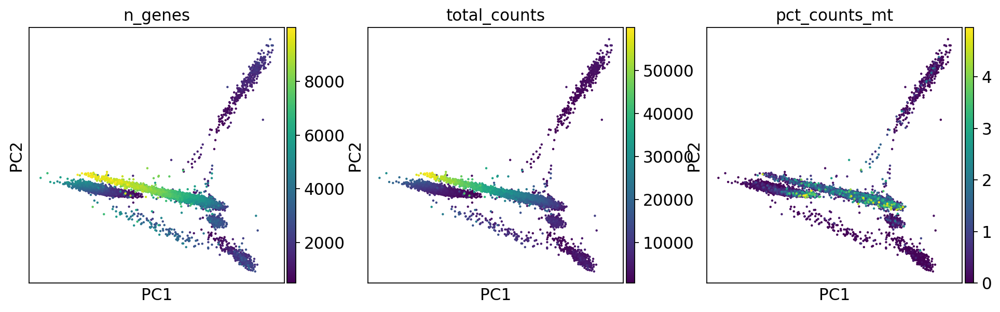

altena _reg


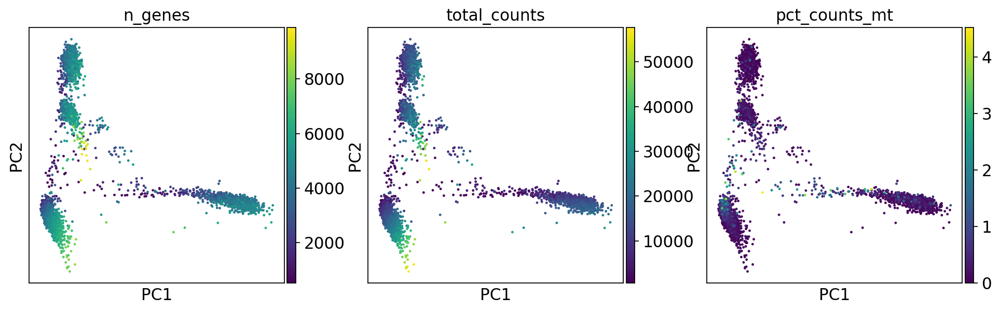

altena_CB _reg


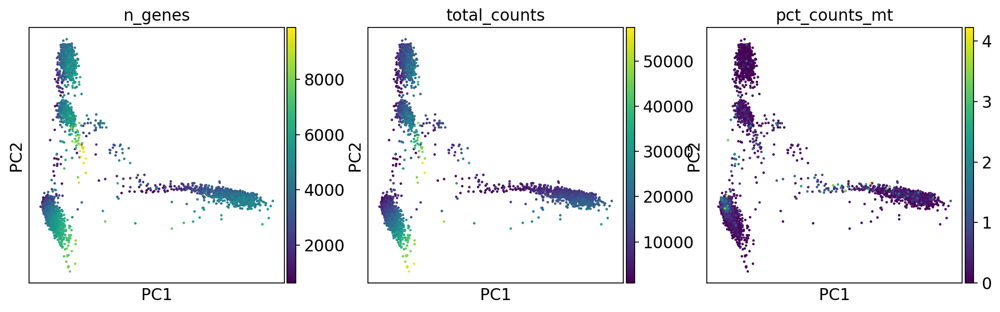

In [39]:
for i in range(numberobj):
    print(names[i],'_reg')
    sc.pl.pca(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'])#, save = "_"+object_names_reg[i]+"_pca.pdf")

**Visualizing cells with marker genes:**<br>
Gfap: Astrocytes <br>
Plp1: myelin proteolipid protein, oligodendritic glial sheaths<br>
Rbfox3: post-mitotic neurons<br>
Gad1: GABAergic neuronal marker (extrasynaptic and metabolic purposes)<br>
Gad2: GABAergic neuronal marker (regulate vesicular pool for release)<br>
Slc17a6: glutamatergic neurons (with Th colocalize VTA)<br>
Th: Dopaminergic neurons<br>
Pecam1: Endothelial cells<br>
P2ry12: Microglia<br>

siletti


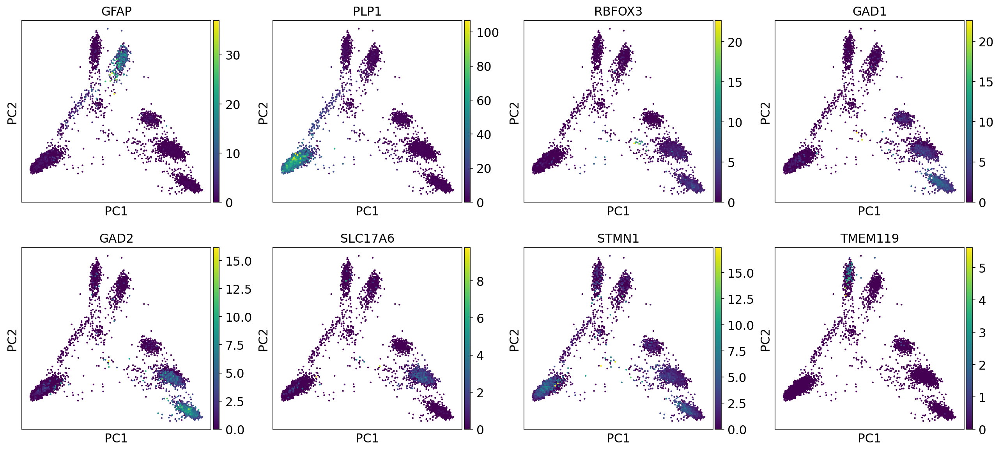

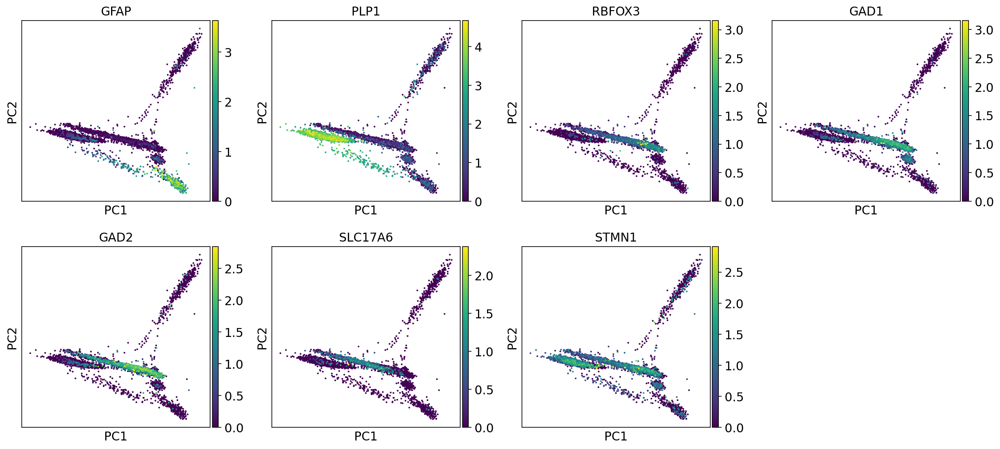

siletti_CB


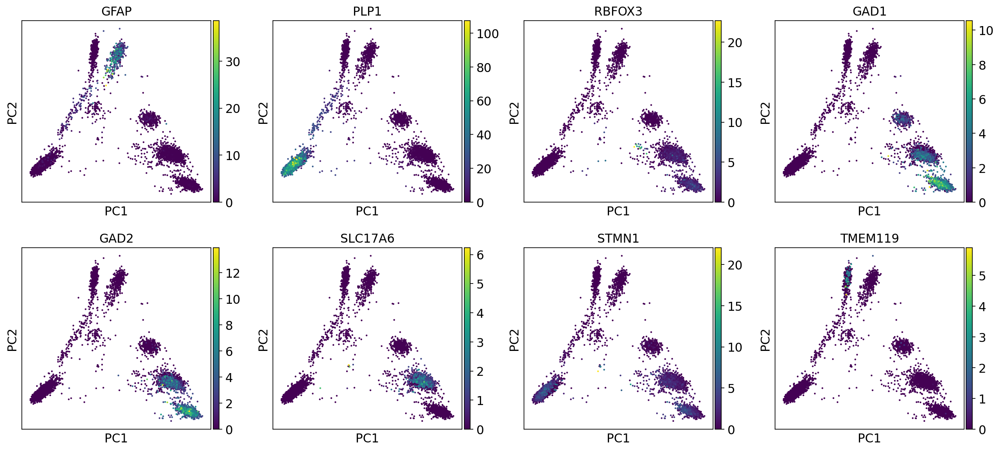

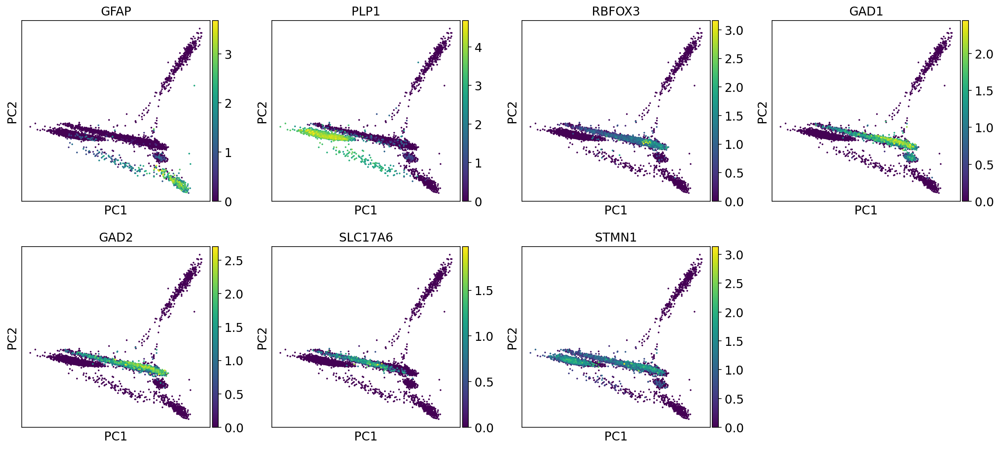

altena


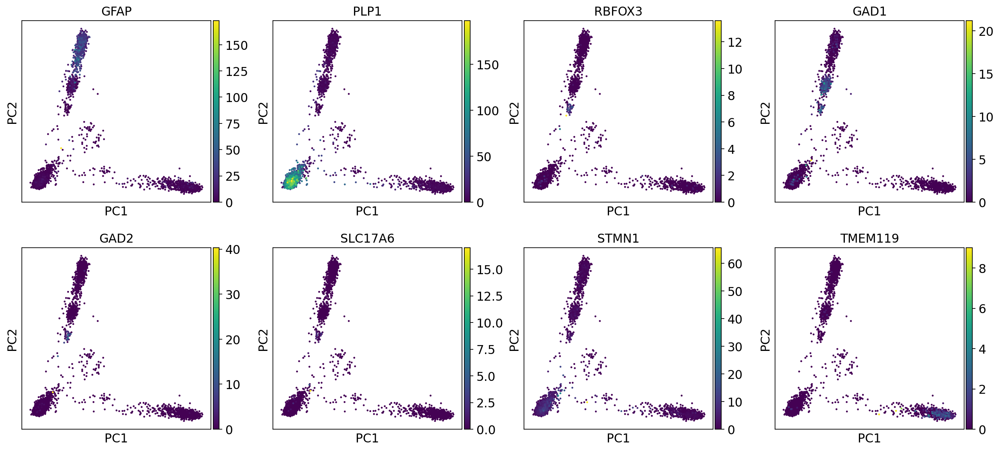

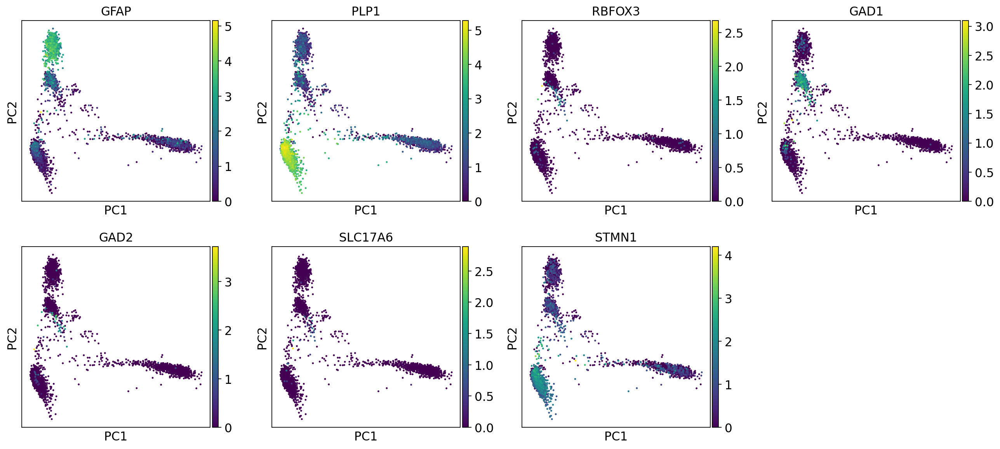

altena_CB


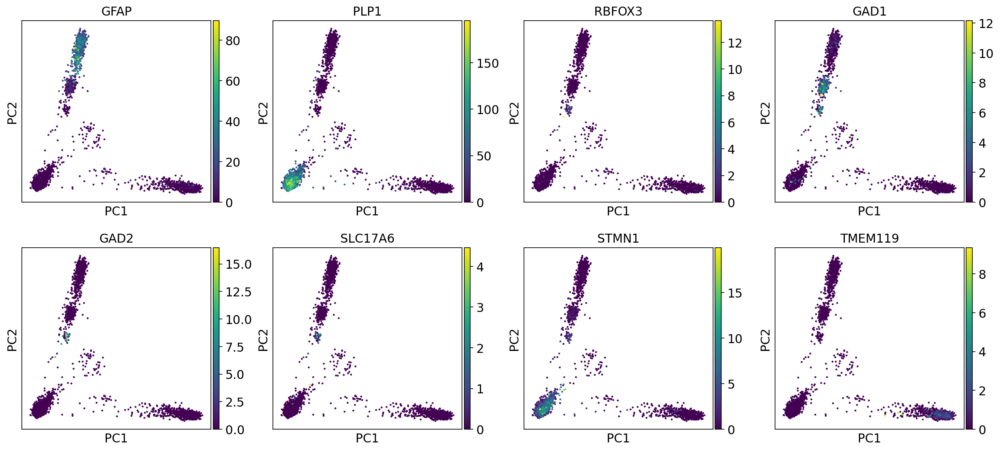

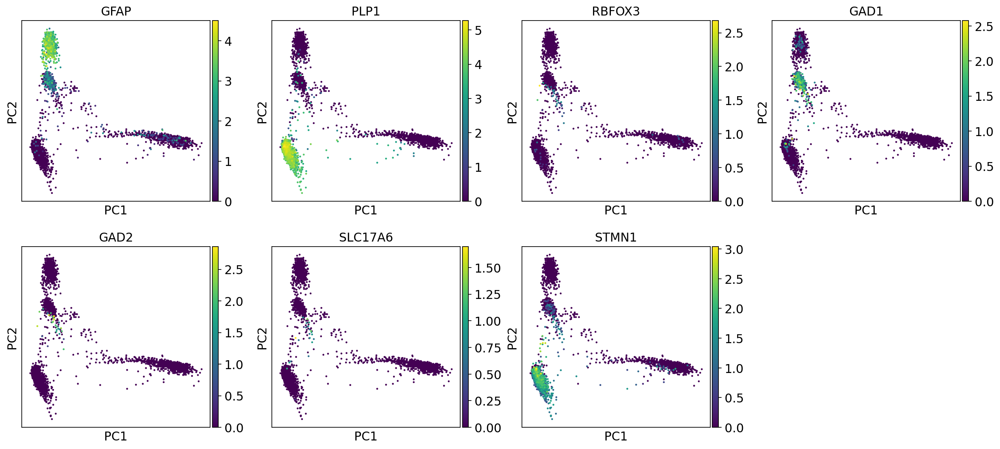

In [55]:
for i in range(numberobj):
    print(names[i])
    if locals()[object_names_filtered[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.pca(locals()[object_names_filtered[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1','TMEM119']), 
               # save = "_"+object_names_filtered[i]+"_pca_markers.pdf") # title =object_names[i],
        sc.pl.pca(locals()[object_names_reg[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1'])
#                save = "_"+object_names_reg[i]+"_metrics_2.pdf") #title =object_names[i],
    elif locals()[object_names_filtered[i]].obs['species'][0] == 'Mus musculus':
        sc.pl.pca(locals()[object_names_filtered[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2','Slc17a6','Th','Pecam1','P2ry12' ]), 
                #save = "_"+object_names_filtered[i]+"_pca_markers.pdf") #title =object_names_reg[i], 
        sc.pl.pca(locals()[object_names_reg[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th']), 
#                save = "_"+object_names_reg[i]+"_metrics_2.pdf") #title =object_names_reg[i], 


siletti _reg


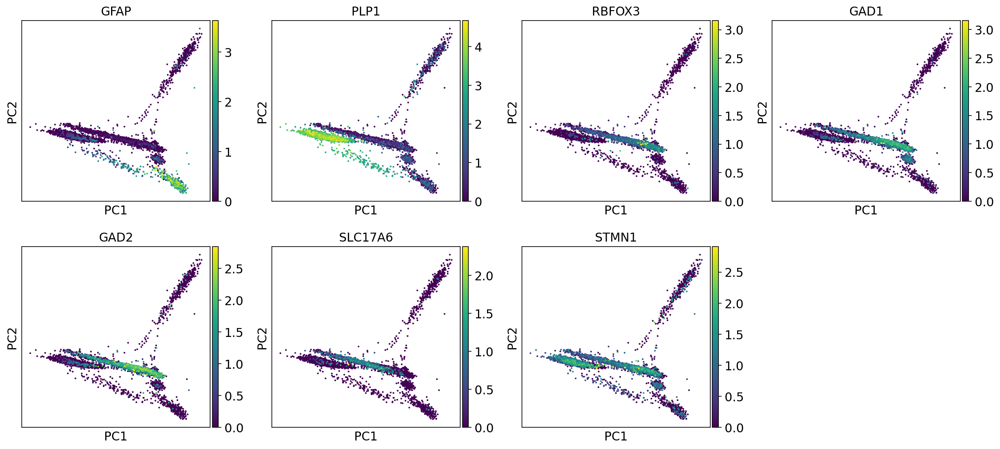

siletti_CB _reg


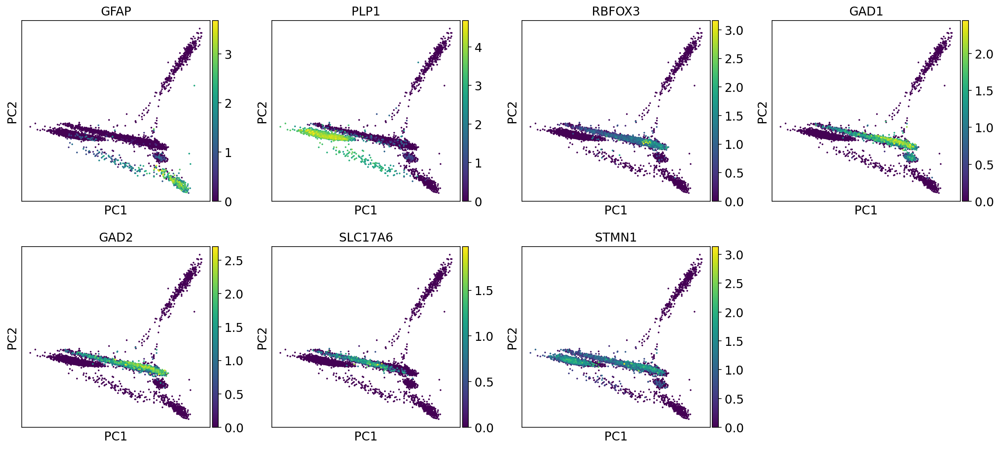

altena _reg


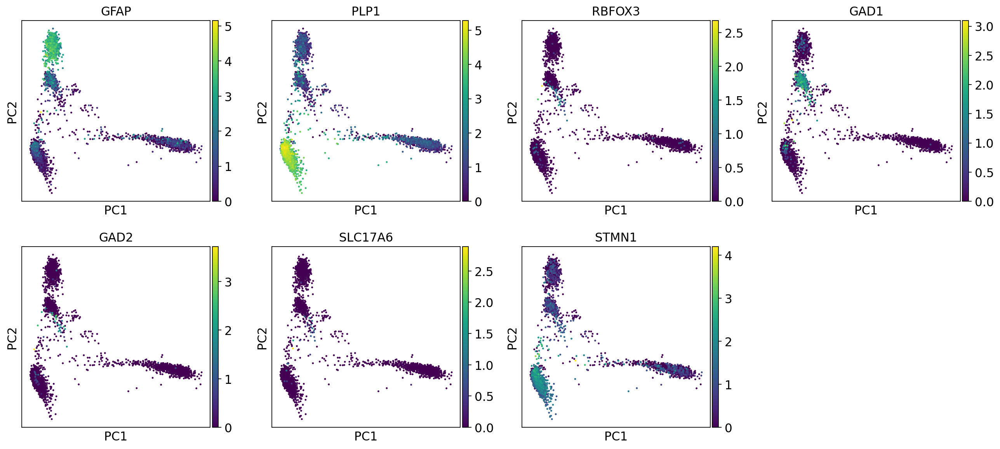

altena_CB _reg


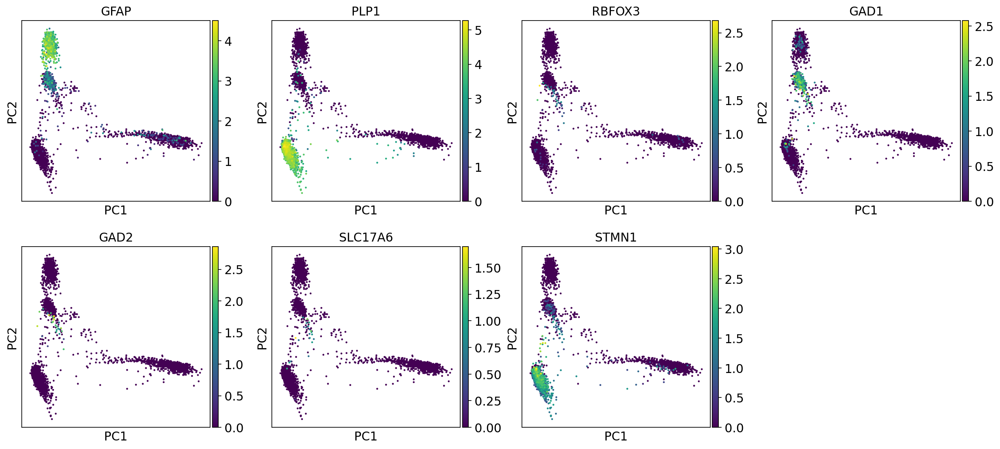

In [54]:
for i in range(numberobj):
    print(names[i], '_reg')
    if locals()[object_names_filtered[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.pca(locals()[object_names_reg[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1']), 
#                save = "_"+object_names_reg[i]+"_metrics_2.pdf") #title =object_names[i],
    elif locals()[object_names_filtered[i]].obs['species'][0] == 'Mus musculus':
        sc.pl.pca(locals()[object_names_reg[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th']), 
               # save = "_"+object_names_reg[i]+"_pca_markers.pdf") #title =object_names_reg[i], 


Seems like taking only highly variable genes tends to cluster everything together -> maybe due to outliers

In [28]:
!ls figures/pca

pca_adata_anna_custom_filtered_1_pca_markers.pdf
pca_adata_anna_custom_filtered_1_pca.pdf
pca_adata_anna_custom_filtered_1_reg_pca.pdf
pca_adata_anna_standard_filtered_1_pca_markers.pdf
pca_adata_anna_standard_filtered_1_pca.pdf
pca_adata_anna_standard_filtered_1_reg_pca.pdf
pca_adata_siletti_custom_filtered_1_pca_markers.pdf
pca_adata_siletti_custom_filtered_1_pca.pdf
pca_adata_siletti_custom_filtered_1_reg_pca.pdf
pca_adata_siletti_standard_filtered_1_pca_markers.pdf
pca_adata_siletti_standard_filtered_1_pca.pdf
pca_adata_siletti_standard_filtered_1_reg_pca.pdf


In [29]:
for i in range(numberobj):
    print(locals()[object_names_filtered[i]])

AnnData object with n_obs × n_vars = 7535 × 31133
    obs: 'n_counts', 'species', 'sample_group', 'atlas', 'reference', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'scrublet', 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
AnnData object with n_obs × n_vars = 7530 × 30938
    obs: 'n_counts', 'species', 'sample_group', 'atlas', 'reference', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_cou

### UMAP

Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. \
We will run the following for quick analyses. Later, we will use some metrics to fing out the best dimensionality reduction parameters for UMAP and t-SNE. This is best done on merged datasets

In [42]:
 for i in range(numberobj):
    nn = int(np.sqrt(len(locals()[object_names_filtered[i]])/2))
    print(nn)

61
61
56
56


In [43]:
nn= 15 #default 15
for i in range(numberobj):
    sc.pp.neighbors(locals()[object_names_filtered[i]], n_neighbors=nn, n_pcs=40)
    sc.pp.neighbors(locals()[object_names_reg[i]], n_neighbors=nn, n_pcs=40)
    sc.tl.umap(locals()[object_names_filtered[i]])
    sc.tl.umap(locals()[object_names_reg[i]])

In [44]:
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/0_reference_genome_testing_custom_siletti/figures/umap')

siletti _reg


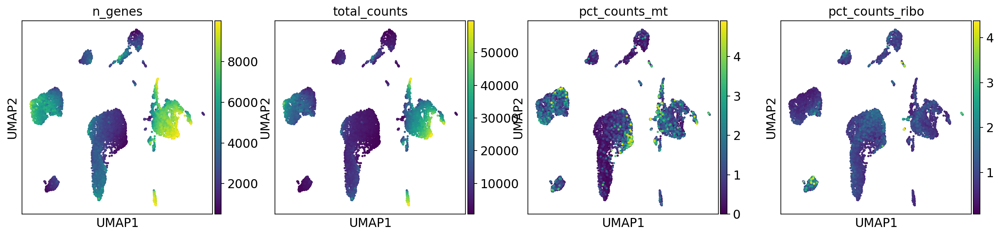

siletti


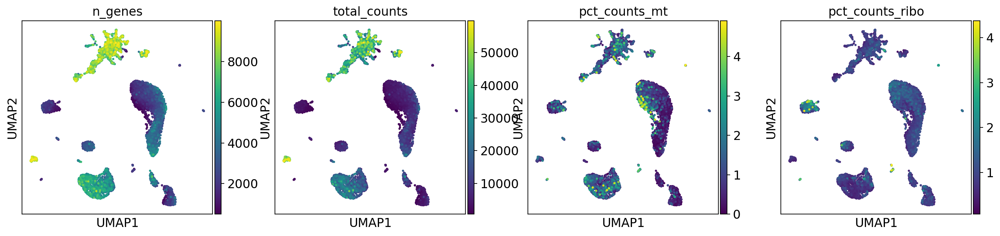

siletti_CB _reg


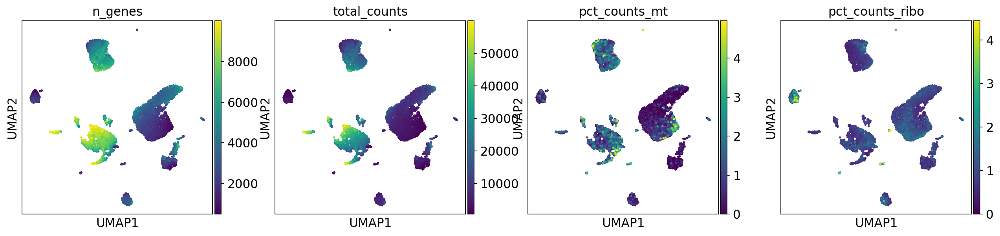

siletti_CB


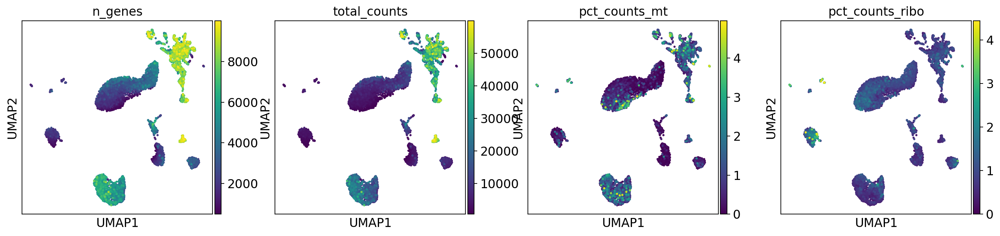

altena _reg


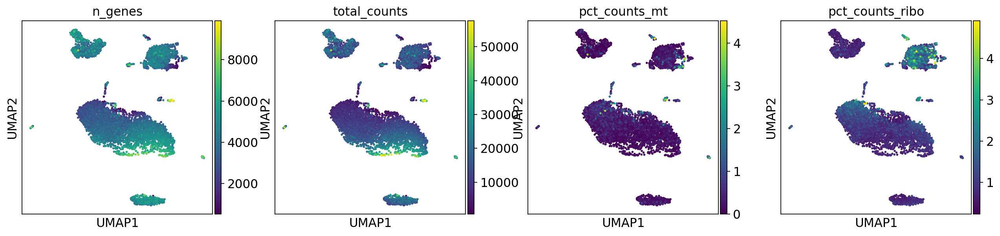

altena


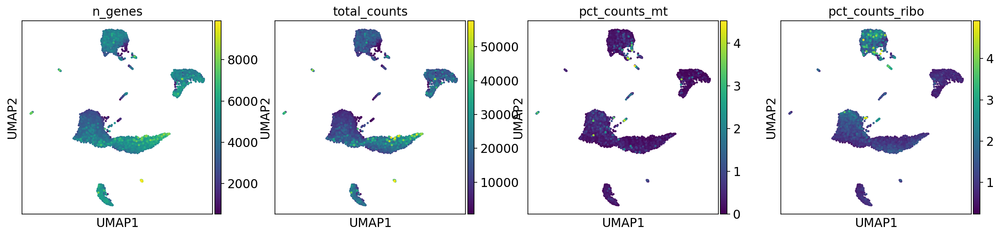

altena_CB _reg


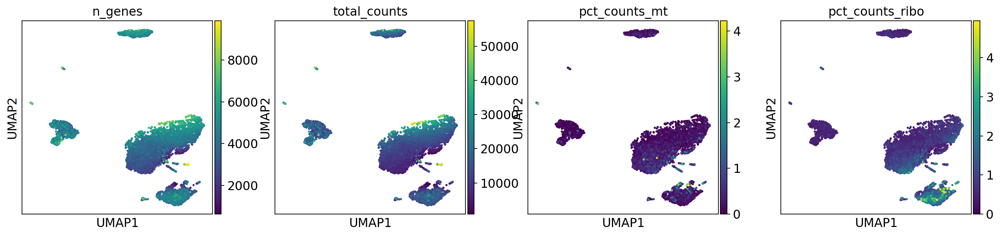

altena_CB


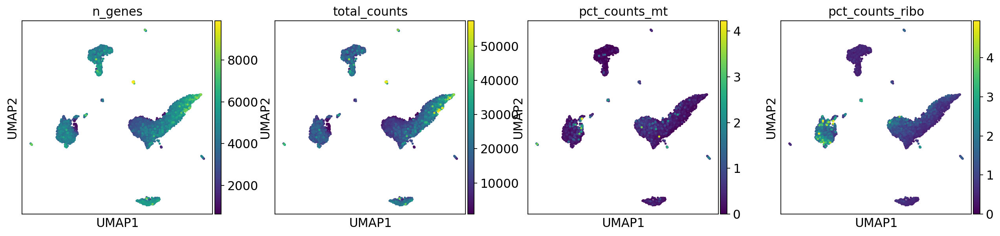

In [58]:
for i in range(numberobj):
    print(names[i],'_reg')
    sc.pl.umap(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], use_raw=True, s=25)
    print(names[i])
    sc.pl.umap(locals()[object_names_filtered[i]], color=['n_genes', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], use_raw=True, s=25)
              #,save = "_"+object_names_reg[i]+"_umap_n"+str(nn)+".pdf")

In [66]:
locals()[object_names_filtered[0]].obs['log1p_total_counts']

AAACCCAAGTTTCGAC-1     8.159375
AAACCCACATCGTTCC-1     9.057073
AAACCCAGTTATTCTC-1     8.769041
AAACCCATCGAGAGCA-1     9.046290
AAACCCATCGGAGTGA-1    10.158323
                        ...    
TTTGGTTGTGAGTAAT-1     6.822197
TTTGGTTTCGCCTATC-1     9.266532
TTTGGTTTCTAAGAAG-1    10.299811
TTTGTTGCACCCAAGC-1     9.279960
TTTGTTGCAGGCATTT-1     9.896161
Name: log1p_total_counts, Length: 7618, dtype: float32

### Plot with marker genes

siletti


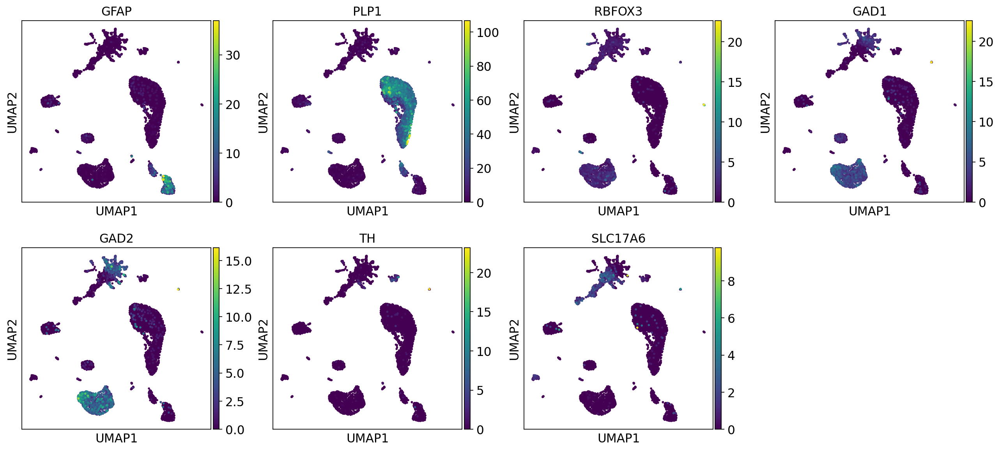

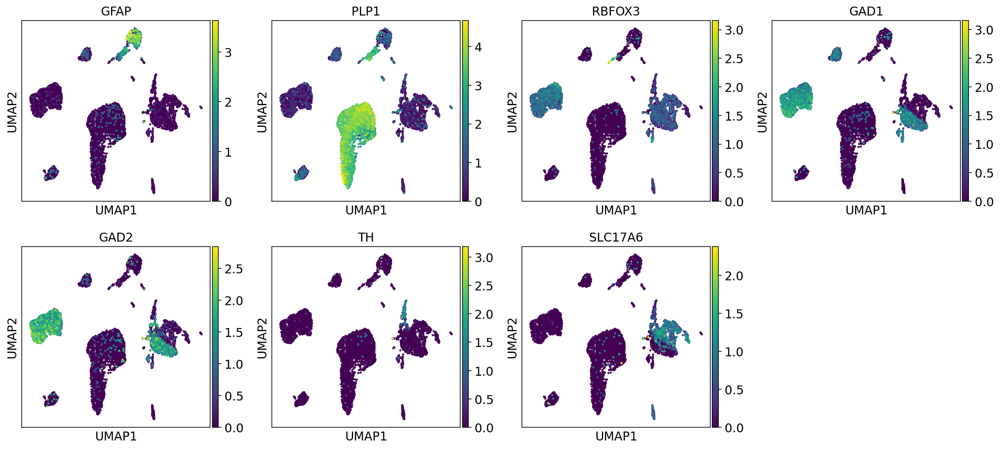

siletti_CB


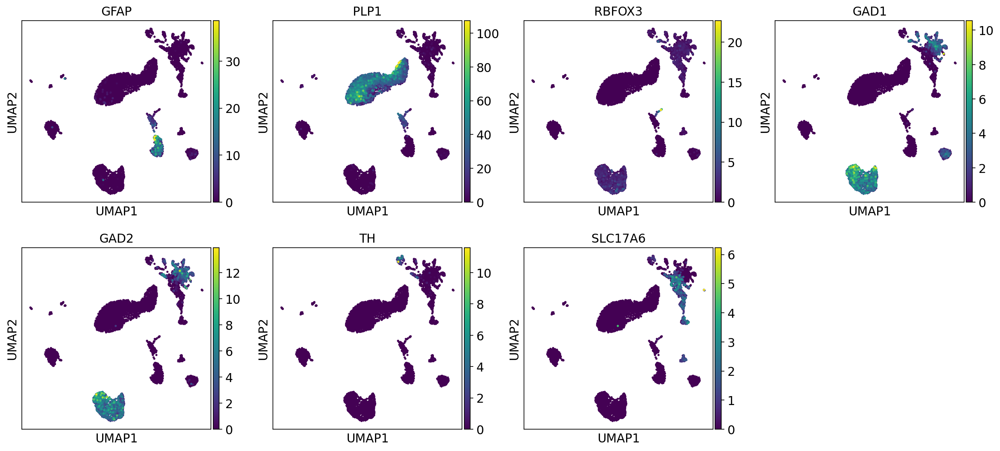

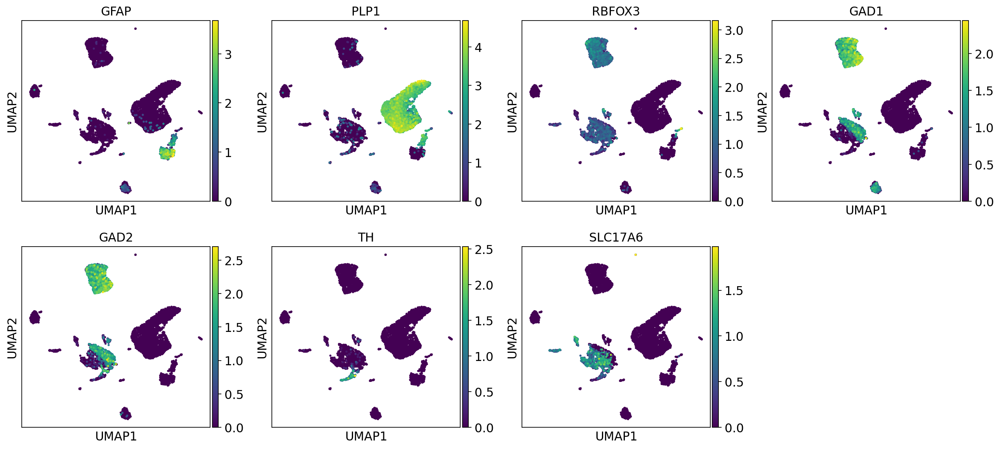

altena


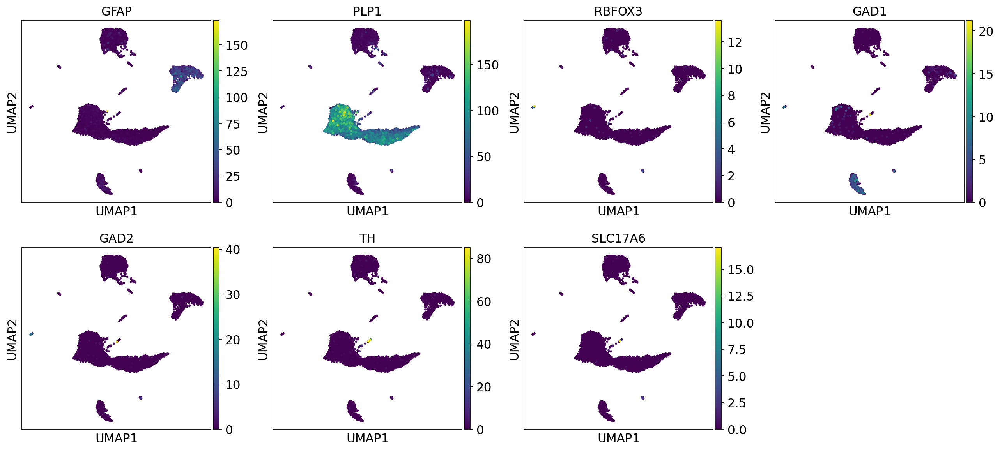

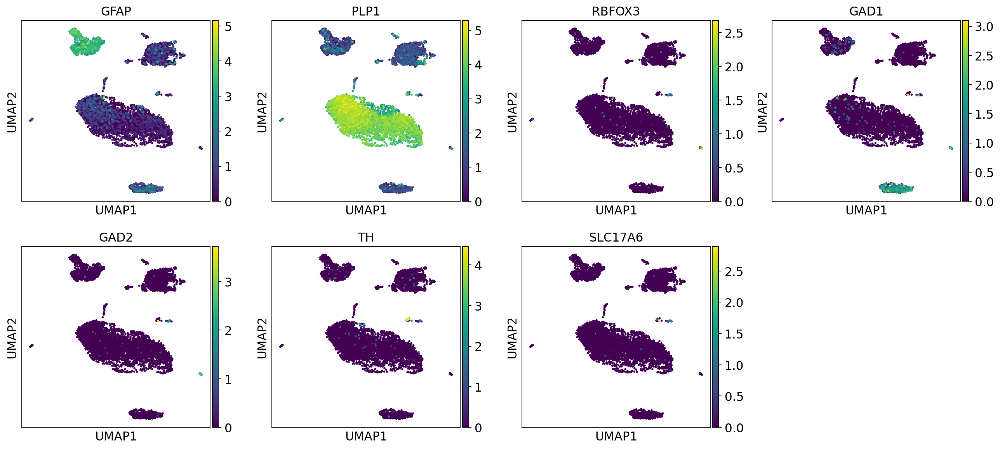

altena_CB


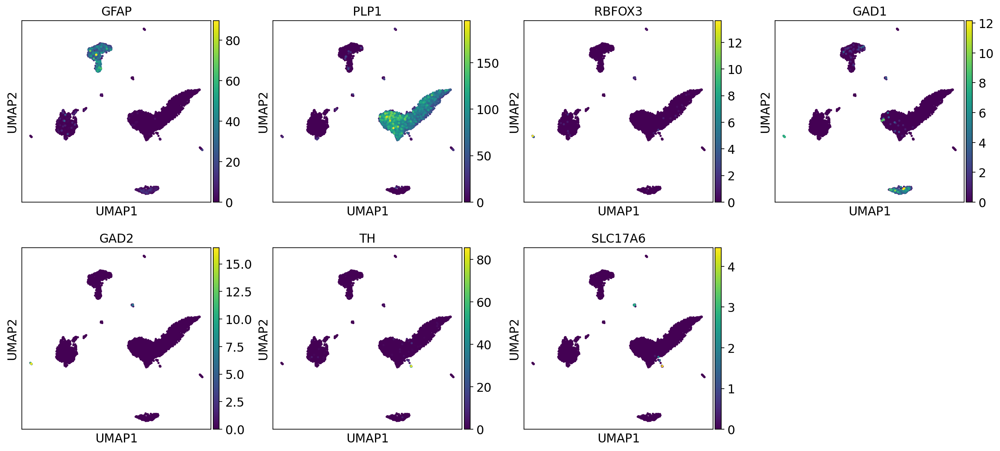

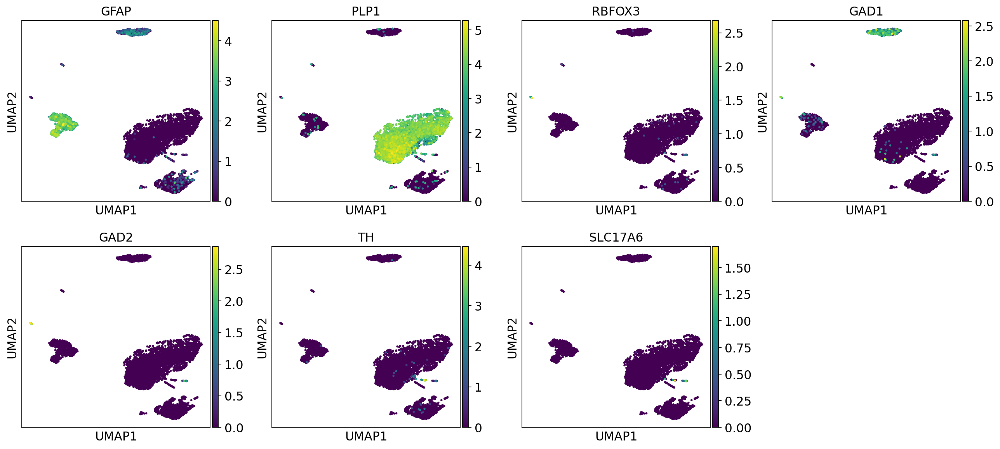

In [59]:
for i in range(numberobj):
    print(names[i])
    if locals()[object_names_filtered[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.umap(locals()[object_names_filtered[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'TH','SLC17A6'], use_raw=True, s=25)
        sc.pl.umap(locals()[object_names_reg[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'TH','SLC17A6'], use_raw=True, s=25)       #  ,save = "_"+object_names_filtered[i]+"_umap_markers_n"+str(nn)+".pdf")
    else:
        sc.pl.umap(locals()[object_names_filtered[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'], use_raw=True, s=25)
              #    ,save = "_"+object_names_filtered[i]+"_umap_markers_n"+str(nn)+".pdf")

In [49]:
ls 

figures/
umap_adata_anna_custom_filtered_1_reg_umap_markers_n15.pdf
umap_adata_anna_custom_filtered_1_reg_umap_n15.pdf
umap_adata_anna_custom_filtered_1_umap_markers_n15.pdf
umap_adata_anna_custom_filtered_1_umap_n15.pdf
umap_adata_anna_standard_filtered_1_reg_umap_markers_n15.pdf
umap_adata_anna_standard_filtered_1_reg_umap_n15.pdf
umap_adata_anna_standard_filtered_1_umap_markers_n15.pdf
umap_adata_anna_standard_filtered_1_umap_n15.pdf
umap_adata_siletti_custom_filtered_1_reg_umap_markers_n15.pdf
umap_adata_siletti_custom_filtered_1_reg_umap_n15.pdf
umap_adata_siletti_custom_filtered_1_umap_markers_n15.pdf
umap_adata_siletti_custom_filtered_1_umap_n15.pdf
umap_adata_siletti_standard_filtered_1_reg_umap_markers_n15.pdf
umap_adata_siletti_standard_filtered_1_reg_umap_n15.pdf
umap_adata_siletti_standard_filtered_1_umap_markers_n15.pdf
umap_adata_siletti_standard_filtered_1_umap_n15.pdf


### Save
nn =15

In [67]:
print(object_names_filtered[i][6:].split('_filtered')[0])

altena_CB


In [70]:
for i in range(numberobj):
    locals()[object_names_filtered[i]].write(os.path.join('./data/'+object_names_filtered[i][6:].split('_filtered')[0])+'_f1_processed_1.h5ad')
    locals()[object_names_reg[i]].write(os.path.join('./data/'+object_names_reg[i][6:].split('_filtered')[0])+'_f1_reg_processed_1.h5ad')

In [71]:
!ls data

altena_CB_f1_processed_1.h5ad	   siletti_CB_f1_processed_1.h5ad
altena_CB_f1_reg_processed_1.h5ad  siletti_CB_f1_reg_processed_1.h5ad
altena_CB_filtered_1.h5ad	   siletti_CB_filtered_1.h5ad
altena_CB_preprocessed.h5ad	   siletti_CB_preprocessed.h5ad
altena_f1_processed_1.h5ad	   siletti_f1_processed_1.h5ad
altena_f1_reg_processed_1.h5ad	   siletti_f1_reg_processed_1.h5ad
altena_filtered_1.h5ad		   siletti_filtered_1.h5ad
altena_preprocessed.h5ad	   siletti_preprocessed.h5ad
